<a href="https://colab.research.google.com/github/khusheedhanuka/recommendation_systems/blob/main/Goibibo_Hotel_Recommendation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle

In [ ]:
!kaggle datasets download -d aslibaraf/goibibo-indian-hotels-dataset-scraped


Dataset URL: https://www.kaggle.com/datasets/aslibaraf/goibibo-indian-hotels-dataset-scraped
License(s): unknown
goibibo-indian-hotels-dataset-scraped.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile

with zipfile.ZipFile("/content/goibibo-indian-hotels-dataset-scraped.zip", 'r') as zip_ref:
    zip_ref.extractall("hotel")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
data = pd.read_csv("/content/hotel/HotelData.csv")

In [ ]:
data

,Unnamed: 0,_id,Unnamed: 2,Name,URL,Total Rating,Review_Score,New Total,Code,Rating,City_y,Amenities,Latitude,Longitude,Price,Address,City,CityLabel,cluster
0,0,628752bdd04899399ca36d45,0,Cloud Green Resort & Spa,/hotels/cloud-green-resort-spa-hotel-in-mahaba...,465 Ratings,3.9 / 5,465.0,4018,3.9,Mahabaleshwar,"['Sanitizers', 'Parking (Free)', 'Wifi (Free)'...",17582,73746,2119.0,"311, Mahabaleshwar panchgani road, near lin...",Mahabaleshwar,38,4
1,1,628752bdd04899399ca36d46,1,Forest County Resort,/hotels/forest-county-resort-hotel-in-mahabale...,225 Ratings,3.8 / 5,225.0,6018,3.8,Mahabaleshwar,"['Masks (Paid)', 'Gloves (Paid)', 'Thermal scr...",17857,73812,4650.0,"VARCHI MALUSARWADI, POST-TALDEV, HOUSE NO.82,,...",Mahabaleshwar,38,4
2,2,628752bdd04899399ca36d47,2,Regenta MPG Club,/hotels/regenta-mpg-club-hotel-in-mahabaleshwa...,391 Ratings,4.3 / 5,391.0,5018,4.3,Mahabaleshwar,"['Hair nets (for hotel staff)', 'Thermal scree...",17795,73689,6388.0,"MPG Club, 233 Old Tapola Road, Dist.Satara,",Mahabaleshwar,38,4
3,3,628752bdd04899399ca36d48,3,"Bellevue Resort, Panchgani",/hotels/bellevue-resort-panchgani-hotel-in-mah...,248 Ratings,3.9 / 5,248.0,4018,3.9,Mahabaleshwar,"['Sanitizers', 'Parking (Free)', 'Wifi (Free)'...",17,73,2392.0,"Bhilar Kaswand Road, Bhilar Hill station betwe...",Mahabaleshwar,38,4
4,4,628752bdd04899399ca36d49,4,NANDANVAN TENT AND RESORT,/hotels/nandanvan-tent-and-resort-hotel-in-mah...,27 Ratings,4.4 / 5,27.0,2017,4.4,Mahabaleshwar,['Hospital in the vicinity (Between 5 and 10 k...,17,73,2637.0,"SR NO 5/1 , NEAR BSNL OFFICE , MAHABALESHWAR T...",Mahabaleshwar,38,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11880,11880,628752c2d04899399ca39bad,11880,Hotel Al Qasa,/hotels/al-qasa-hotel-in-chandigarh-1979360606...,187 Ratings,4.2 / 5,187.0,1018,4.2,Chandigarh,"['Masks', 'Sanitizers', 'Thermal screening at ...",30,76,2271.0,"Site Number 6, Zirakpur-Patiala Highway, Near ...",Chandigarh,8,40
11881,11881,628752c2d04899399ca39bae,11881,Country Inn & Suites by Radisson - Zirakpur (C...,/hotels/country-inn-suites-by-radisson-zirakpu...,946 Ratings,4.5 / 5,946.0,4018,4.5,Chandigarh,"['Masks (Free)', 'Disinfectant wipes (Free)', ...",30,76,5580.0,NH 21 Ambala Chandigarh Highway\r\nPabhat area...,Chandigarh,8,40
11882,11882,628752c2d04899399ca39baf,11882,FabHotel Diamond,/hotels/fabhotel-diamond-hotel-in-chandigarh-4...,24 Ratings,3.4 / 5,24.0,4018,3.4,Chandigarh,"['Sanitizers', 'Sanitizers installed', 'Disinf...",30,76,1166.0,"Sco-35, Zirakpur Kalka Highway, Zirakpur, Near...",Chandigarh,8,40
11883,11883,628752c2d04899399ca39bb0,11883,SPOT ON 41466 Hotel Pavraj,/hotels/spot-on-41466-pavraj-hotel-in-chandiga...,4 Ratings,3.9 / 5,4.0,2018,3.9,Chandigarh,"['Sanitizers', 'Face shields (for hotel staff)...",30,76,1357.0,"00025, B-10,Adarsh Nagar, Chandigarh",Chandigarh,8,40


In [ ]:
data.columns


Index(['Unnamed: 0', '_id', 'Unnamed: 2', 'Name', 'URL', 'Total Rating',
       'Review_Score', 'New Total', 'Code', 'Rating', 'City_y', 'Amenities',
       'Latitude', 'Longitude', 'Price', 'Address', 'City', 'CityLabel',
       'cluster'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11885 entries, 0 to 11884
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    11885 non-null  int64  
 1   _id           11885 non-null  object 
 2   Unnamed: 2    11885 non-null  int64  
 3   Name          11885 non-null  object 
 4   URL           11885 non-null  object 
 5   Total Rating  11156 non-null  object 
 6   Review_Score  11156 non-null  object 
 7   New Total     8044 non-null   float64
 8   Code          11885 non-null  int64  
 9   Rating        8044 non-null   float64
 10  City_y        11885 non-null  object 
 11  Amenities     11885 non-null  object 
 12  Latitude      11885 non-null  int64  
 13  Longitude     11885 non-null  int64  
 14  Price         11813 non-null  float64
 15  Address       11885 non-null  object 
 16  City          11885 non-null  object 
 17  CityLabel     11885 non-null  int64  
 18  cluster       11885 non-nu

In [ ]:
data.describe()

,Unnamed: 0,Unnamed: 2,New Total,Code,Rating,Latitude,Longitude,Price,CityLabel,cluster
count,11885.000000,11885.000000,8044.000000,11885.000000,8044.000000,11885.000000,11885.000000,11813.000000,11885.000000,11885.000000
mean,5942.000000,5942.000000,195.245525,4200.689020,3.983926,2024.098443,7295.982667,3071.488445,39.602524,20.300210
std,3431.048309,3431.048309,413.187324,2596.084399,0.761537,6696.811823,22486.937019,3779.757828,21.102769,14.091328
min,0.000000,0.000000,1.000000,1.000000,1.100000,8.000000,-109.000000,199.000000,0.000000,0.000000
25%,2971.000000,2971.000000,7.000000,2018.000000,3.500000,17.000000,74.000000,1320.000000,24.000000,8.000000
50%,5942.000000,5942.000000,42.000000,4018.000000,4.100000,25.000000,77.000000,2066.000000,43.000000,18.000000
75%,8913.000000,8913.000000,193.000000,6018.000000,4.500000,30.000000,79.000000,3487.000000,56.000000,31.000000
max,11884.000000,11884.000000,7505.000000,9018.000000,5.000000,34933.000000,88947.000000,86925.000000,71.000000,51.000000


In [ ]:
data.isnull().sum()

,0
Unnamed: 0,0
_id,0
Unnamed: 2,0
Name,0
URL,0
Total Rating,729
Review_Score,729
New Total,3841
Code,0
Rating,3841


In [ ]:
city_group = data.groupby('City').size().reset_index(name='Hotel Count')
print(city_group)

             City  Hotel Count
0             Abu          127
1            Agra          394
2           Ajmer          156
3        Alleppey          250
4          Almora           56
..            ...          ...
67        Varkala           93
68  Visakhapatnam          260
69        Wayanad          350
70           Ziro            8
71        udaipur          729

[72 rows x 2 columns]


<ipython-input-12-a09f731585dc>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=city_counts.index, y=city_counts.values, palette='viridis')


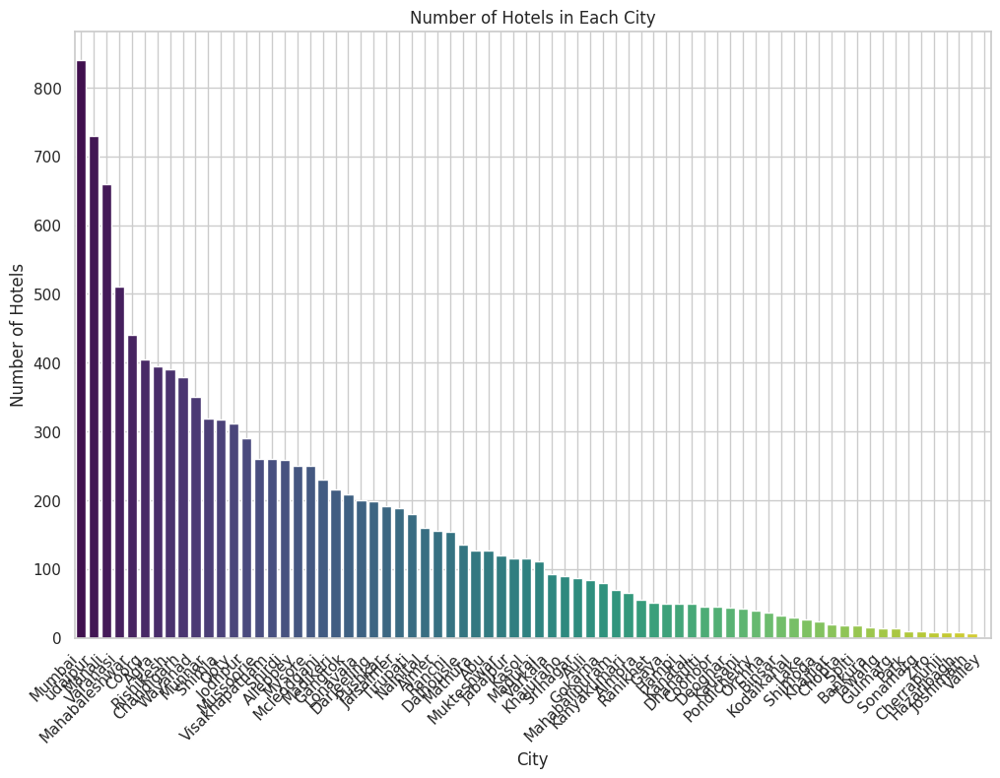

In [ ]:
# Count the number of hotels in each city
city_counts = data['City'].value_counts()

# Set the style for seaborn
sns.set(style='whitegrid')

# Create a bar chart for the number of hotels in each city
plt.figure(figsize=(12, 8))
sns.barplot(x=city_counts.index, y=city_counts.values, palette='viridis')
plt.title('Number of Hotels in Each City')
plt.xlabel('City')
plt.ylabel('Number of Hotels')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.show()

In [ ]:
data['Amenities']

,Amenities
0,"['Sanitizers', 'Parking (Free)', 'Wifi (Free)', 'Air Conditioning', 'Room service (Limited duration)', 'Power backup', 'Intercom', 'Telephone', 'Housekeeping', 'Public restrooms', 'Laundry (Paid)', 'Newspaper (English)', 'Bathroom (Attached)', 'Swimming Pool (Common Pool, Kids Pool)', ""Children's play area"", 'Restaurant', 'Dining Area', 'Barbeque', 'Kids meals', 'CCTV', 'Fire extinguishers', 'Security', 'Luggage storage', 'Mail services', 'Luggage assistance', 'Electrical Sockets', 'Doctor on call', 'Ticket/ Tour Assistance', 'Bellboy service', 'Wake-up Call / Service', 'Facial treatments', 'Spa (Paid)', 'Massage (Couple Massage, Foot massage)', 'Steam and Sauna (Paid)', 'Bonfire (On Request)', 'Vehicle Rentals', 'Indoor games', 'Lawn', 'Reception', 'Seating Area', 'Conference room', 'Printer']"
1,"['Masks (Paid)', 'Gloves (Paid)', 'Thermal screening at entry and exit points', 'Sanitizers installed', 'Parking (Free)', 'Air Conditioning (Room controlled)', 'Room service (Limited duration)', 'Power backup', 'Smoking rooms', 'Wifi', 'Intercom', 'Ironing services', 'Refrigerator', 'Housekeeping', 'Public restrooms', 'Bathroom (Attached)', 'Swimming Pool (Common Pool, Kids Pool)', 'Newspaper (English, Local Language)', 'Pickup/ Drop (Paid)', 'Shuttle Service (Paid)', 'Railway Station Transfers (Paid)', 'Airport Transfers (Paid)', 'Bus Station transfers (Paid)', 'Public transit tickets', 'Restaurant', 'Ticket/ Tour Assistance', 'Lawn', 'Reception', 'Seating Area', 'Conference room']"
2,"['Hair nets (for hotel staff)', 'Thermal screening at entry and exit points', 'Sanitizers installed', 'Disinfection', 'Contactless room service', 'Disposable serveware', 'Hospital in the vicinity (Less than 5 km)', 'Contactless check-in', 'Wifi (Free)', 'Kitchen/Kitchenette', 'Air Conditioning', 'Room service', 'Power backup', 'Laundry', 'LAN', 'Parking', 'Intercom', 'Ironing services', 'Telephone', 'Housekeeping', 'Newspaper', 'Washing Machine', 'Public restrooms', 'Umbrellas', 'Swimming Pool (Common Pool)', 'Bathroom (Attached)', 'Private Entrance ', ""Children's play area"", 'Restaurant', 'Barbeque', 'Emergency exit map', 'Safe', 'CCTV', 'Fire extinguishers', 'Safety and Security', 'Security', 'Gym/ Fitness centre', 'First-aid services', 'Electrical Adapters Available', 'Electrical chargers (International Chargers)', 'TV (LCD)', 'Luggage storage', 'Multilingual Staff', 'Luggage assistance', 'Doctor on call', 'Ticket/ Tour Assistance', 'Wake-up Call / Service', 'Wheelchair (Free)', 'Spa', 'Steam and Sauna', 'Massage', 'Cycling', 'Vehicle Rentals', 'Indoor games (Board Games, Carrom Board, Puzzles, Table tennis)', 'Dispensors for disinfectants', 'PPE (Personal Protective Equipment) kits (for hotel staff)', 'Lawn', 'Reception', 'Conference room', 'Banquet']"
3,"['Sanitizers', 'Parking (Free)', 'Wifi (Free)', 'Air Conditioning (Room controlled)', 'Room service', 'Smoking rooms', 'Intercom', 'Refrigerator', 'Housekeeping', 'Laundry (Paid)', 'Swimming Pool (Common Pool)', 'LAN (Free)', 'Bathroom (Attached)', 'Newspaper (Local Language)', 'Bus Station transfers (Paid)', 'Airport Transfers (Paid)', 'Pickup/ Drop (Paid)', 'Railway Station Transfers (Paid)', ""Children's play area"", 'Restaurant (Halal)', 'Dining Area', 'Coffee shop (Limited Hours)', 'CCTV', 'Safety and Security', 'Security (24 hours security)', 'Safe (In room safe)', 'Gym/ Fitness centre', 'Yoga', 'Events (Karaoke)', 'Electrical chargers', 'TV (Cable, LED)', 'Luggage storage', 'Multilingual Staff', 'Luggage assistance', 'Electrical Sockets', 'Doctor on call', 'Ticket/ Tour Assistance', 'Wake-up Call / Service', 'Wheelchair (Free)', 'Pool/ Beach towels', 'Outdoor sports (Badminton)', 'Guided Tours And Treks (Paid)', 'Bonfire (Paid)', 'Indoor games (Carrom Board, Table tennis)', 'Lawn', 'Fireplace', 'Sun Deck', 'Reception', 'Library', 'Seating Area', 'Printer', 'Photocopying', 'Fax service']"
4,"['Hospital in the vicinity (Between 5 and 10 km)', 'Parking (Free)', 'Room servic

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert the list of amenities to a string format
data['Amenities_str'] = data['Amenities'].apply(lambda x: ', '.join(eval(x)))

# Initialize CountVectorizer
vectorizer = CountVectorizer(tokenizer=lambda x: x.split(', '), binary=True)

# Transform the amenities column into a binary matrix
amenities_matrix = vectorizer.fit_transform(data['Amenities_str'])

# Convert the matrix to a DataFrame for easier handling
amenities_df = pd.DataFrame(amenities_matrix.toarray(), columns=vectorizer.get_feature_names_out())


/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(amenities_df)


In [ ]:

def get_similar_hotels_by_name(hotel_name, cosine_sim, top_n=5):

    hotel_index = data.index[data['Name'] == hotel_name].tolist()
    if not hotel_index:
        return "Hotel not found in the dataset."

    hotel_index = hotel_index[0]
    sim_scores = list(enumerate(cosine_sim[hotel_index]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_indices = [i[0] for i in sim_scores[1:top_n+1]]

    return data.iloc[sim_indices]['Name']


input_hotel_name = input("Enter the name of the hotel: ")
similar_hotels = get_similar_hotels_by_name(input_hotel_name, cosine_sim, top_n=5)
print(similar_hotels)



Enter the name of the hotel: Hotel Al Qasa
4344     The Hotel AK Residency
11795           Hotel The 13een
8270            Hotel President
4592          Hotel Delhi Heart
7581            Hotel padmanane
Name: Name, dtype: object


In [ ]:
def get_similar_hotels_by_name_and_location(hotel_name, target_location, cosine_sim, top_n=5):
    # Find the index of the hotel with the given name
    hotel_index = data.index[data['Name'] == hotel_name].tolist()

    if not hotel_index:
        return "Hotel not found in the dataset."

    hotel_index = hotel_index[0]

    # Filter hotels by the target location
    location_filtered_data = data[data['City'] == target_location]

    if location_filtered_data.empty:
        return f"No hotels found in {target_location}."

    # Get the pairwise similarity scores for the given hotel
    sim_scores = list(enumerate(cosine_sim[hotel_index]))

    # Sort the hotels based on similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the indices of hotels in the filtered location
    location_indices = location_filtered_data.index.tolist()

    # Get the indices of the top_n most similar hotels that are in the target location
    sim_indices = [i[0] for i in sim_scores[1:] if i[0] in location_indices][:top_n]

    if not sim_indices:
        return f"No similar hotels found in {target_location}."

    # Return the names of the most similar hotels in the target location
    return data.iloc[sim_indices]['Name']

# Example: Get user input for the hotel name and desired location
input_hotel_name = input("Enter the name of the hotel: ")
input_location = input("Enter the desired location for similar hotels: ")

similar_hotels = get_similar_hotels_by_name_and_location(input_hotel_name, input_location, cosine_sim, top_n=5)
print(similar_hotels)


Enter the name of the hotel: Hotel Al Qasa
Enter the desired location for similar hotels: Chandigarh
11795                     Hotel The 13een
11654     Collection O 45544 Hotel Legacy
11658    OYO 40649 Hotel Kapoor Residency
11559                    HOTEL ESS PEE 91
11781               Velvet Clarks Exotica
Name: Name, dtype: object


In [ ]:
hotel_info=pd.read_csv("/content/hotel/HotelInfo.csv")
hotel_rev=pd.read_csv("/content/hotel/HotelReview.csv")
hotel_landmark=pd.read_csv("/content/hotel/HotelLandmarks.csv")

<ipython-input-18-76a8fb0257b7>:2: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  hotel_rev=pd.read_csv("/content/hotel/HotelReview.csv")


In [ ]:
hotel_info

,Unnamed: 0,Code,City,Amenities,Latitude,Longitude,Price,Address
0,0,1.001080e+18,Coorg,"['Kitchen/Kitchenette', 'Housekeeping', 'Parki...",12.4503,75.7124,5400,"Kootuhole,Galibeedu Road, Madikeri"
1,1,1.001340e+18,udaipur,"['Masks', 'Sanitizers (Free)', 'Sanitizers ins...",24.6263,73.7111,2158,"sohan sadan,near PNB bank, bhuwana by pass cho..."
2,2,1.001850e+18,Lake,"['Parking (Free)', 'Wifi (Free)', 'Elevator/ L...",28.8982,-81.9110,7001,850 South US Hwy 27/441
3,3,1.004070e+18,Mysore,"['Masks (Paid)', 'Disinfectant wipes (Paid)', ...",12.3046,76.6664,1004,"15/B, HOTEL THE GRAND VANAM, LOKARANJANMAHAL\r..."
4,4,1.004500e+18,Mahabaleshwar,"['Masks', 'Gloves (Paid)', 'Thermal screening ...",17.9235,73.7986,1812,"Pan Hill Hotel, Opposite Bus Stand, Panchgani ..."
...,...,...,...,...,...,...,...,...
11623,11623,9.982690e+17,Jodhpur,"['Sanitizers', 'Parking (Free)', 'Room service...",26.2920,73.0250,467,"155, Nai Sarak, Clock Tower Road, jodhpur"
11624,11624,9.994970e+17,Nainital,"['Masks', 'Gloves', 'Sanitizers', 'Kitchen/Kit...",29.3950,79.4497,3026,"Opposite Nainital Club, Near High Court, Naini..."
11625,11625,9.995770e+17,Rishikesh,"['Sanitizers', 'Parking (Free)', 'Elevator/ Li...",30.1329,78.3210,4000,"KHASRA NO 27 A BEHIND DECON VALLEY, TAPOVAN"
11626,11626,9.996940e+17,Mumbai,"['Air Conditioning', 'Room service', 'Wifi', '...",19.1160,72.8500,4859,Ginger Mumbai Andheri Teli Gali Road Andheri E...


In [ ]:
hotel_rev

,Unnamed: 0.1,Unnamed: 0,Hotel Code,firstName,review,id1,RoomType,submittedAt,totalRating,monthOfStay
0,0,0,1001082775062077907,Shival,The staff was highly unprofessional.,55a512f87e2833d1267c1f4d,Cottage Room,2019-05-16T05:36:37.689Z,2,201905
1,1,1,1001082775062077907,Gouranga,"Best place to stay at coorg. Abbey falls, Duba...",55f2a0c4a27452ba6e89925e,,2017-05-18T10:17:25.909Z,5,201705
2,2,2,1001082775062077907,Nirmal,worst management ever. this place is all about...,5514af0b3fb90b1563ed3f85,,2016-08-30T02:11:25.479Z,1,201608
3,3,3,1001082775062077907,Vivek,"A very nice place to stay, it's out of the cit...",54859cc39f547f015b779cc6,,2016-06-13T07:10:23.157Z,4,201606
4,4,4,1001082775062077907,Hemanga,"The hotel is located in a no man's land, which...",56a184068c3f964862a77be1,,2016-01-27T04:34:52.968Z,1,201601
...,...,...,...,...,...,...,...,...,...,...
848987,166,166,999866272716143921,Rahul,Average experience in this hotel.,56b1b7063767666d1b96888c,,2019-04-27T03:59:48.600Z,3,201904
848988,167,167,999866272716143921,Alpesh,NaN,5b670c3bc9747acf121e1033,,2019-04-13T06:44:14.026Z,5,201904
848989,168,168,999866272716143921,Ramesh,"Good experience ****, AC rooms with compliment...",57b9b1b30e11d7d17245bfd4,,2019-04-05T16:52:05.339Z,4,201903
848990,169,169,999866272716143921,Harshil,one of the best hotel in jabalpur... clean roo...,57ae0f165b4cede43dfceb1a,,2019-04-04T18:09:20.744Z,5,201904


In [ ]:
hotel_rev.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'Hotel Code', 'firstName', 'review',
       'id1', 'RoomType', 'submittedAt', 'totalRating', 'monthOfStay'],
      dtype='object')

In [ ]:
hotel_rev['review'][76]

'Customers service interms of pantry required for morning tea breakfast which is missing otherwise everything is ok about location'

In [ ]:
# Assuming your dataframe is named 'data'
user_ratings = hotel_rev[['firstName', 'Hotel Code', 'totalRating']]


In [ ]:
hotel_rev['totalRating'].unique()

array(['2', '5', '1', '4', '3', '5.0', '4.0', '1.0', '2.0', '3.0', nan,
       ' ', '0'], dtype=object)

In [ ]:
hotel_rev.isna().sum()

,0
Unnamed: 0.1,0
Unnamed: 0,0
Hotel Code,0
firstName,36
review,86723
id1,0
RoomType,0
submittedAt,0
totalRating,15
monthOfStay,470


In [ ]:
import pandas as pd

# Convert the totalRating column to numeric, setting non-convertible values to NaN
hotel_rev['totalRating'] = pd.to_numeric(hotel_rev['totalRating'], errors='coerce')

# Calculate the mean rating for each hotel
mean_ratings = hotel_rev.groupby('Hotel Code')['totalRating'].transform('mean')

# Fill NaN values in the totalRating column with the corresponding mean rating
hotel_rev['totalRating'] = hotel_rev['totalRating'].fillna(mean_ratings)

# Check the updated DataFrame
print(hotel_rev)


        Unnamed: 0.1  Unnamed: 0           Hotel Code      firstName  \
0                  0           0  1001082775062077907         Shival   
1                  1           1  1001082775062077907       Gouranga   
2                  2           2  1001082775062077907         Nirmal   
3                  3           3  1001082775062077907          Vivek   
4                  4           4  1001082775062077907        Hemanga   
...              ...         ...                  ...            ...   
848987           166         166   999866272716143921          Rahul   
848988           167         167   999866272716143921         Alpesh   
848989           168         168   999866272716143921         Ramesh   
848990           169         169   999866272716143921        Harshil   
848991           170         170   999866272716143921  Dheeraj Kumar   

                                                   review  \
0                    The staff was highly unprofessional.   
1       Best 

In [ ]:
hotel_rev.isna().sum()

,0
Unnamed: 0.1,0
Unnamed: 0,0
Hotel Code,0
firstName,36
review,86723
id1,0
RoomType,0
submittedAt,0
totalRating,0
monthOfStay,470


In [ ]:
hotel_rev['firstName'].fillna(method='ffill', inplace=True)


<ipython-input-28-eccb18df17b7>:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hotel_rev['firstName'].fillna(method='ffill', inplace=True)


In [ ]:
import numpy as np

In [ ]:
def matrix_factorization(R, P, Q, K, steps=100, alpha=0.002, beta=0.001):
    Q = Q.T
    for step in range(steps):
        for i in range(len(R)):
            for j in range(len(R[i])):
                if not np.isnan(R[i][j]):  # Ensure R[i][j] is not NaN
                    eij = R[i][j] - np.dot(P[i, :], Q[:, j])
                    for k in range(K):
                        P[i][k] += alpha * (2 * eij * Q[k][j] - beta * P[i][k])
                        Q[k][j] += alpha * (2 * eij * P[i][k] - beta * Q[k][j])
        eR = np.dot(P, Q)
        e = 0
        for i in range(len(R)):
            for j in range(len(R[i])):
                if not np.isnan(R[i][j]):  # Ensure R[i][j] is not NaN
                    e += pow(R[i][j] - np.dot(P[i, :], Q[:, j]), 2)
                    for k in range(K):
                        e += (beta / 2) * (pow(P[i][k], 2) + pow(Q[k][j], 2))
        if e < 0.001:
            break
    return P, Q.T


In [ ]:
import numpy as np
import pandas as pd

# Ensure totalRating is numeric
hotel_rev['totalRating'] = pd.to_numeric(hotel_rev['totalRating'], errors='coerce')

# Drop rows with NaN values in totalRating
hotel_rev = hotel_rev.dropna(subset=['totalRating'])

# Generate unique ids for users and hotels
user_ids = hotel_rev['id1'].unique()
hotel_ids = hotel_rev['Hotel Code'].unique()

# Create mapping from id to index
user_to_index = {user_id: index for index, user_id in enumerate(user_ids)}
hotel_to_index = {hotel_id: index for index, hotel_id in enumerate(hotel_ids)}

# Initialize the rating matrix R
num_users = len(user_ids)
num_hotels = len(hotel_ids)
R = np.zeros((num_users, num_hotels))

# Fill the matrix with the ratings
for _, row in hotel_rev.iterrows():
    if pd.notna(row['id1']) and pd.notna(row['Hotel Code']) and pd.notna(row['totalRating']):
        user_index = user_to_index[row['id1']]
        hotel_index = hotel_to_index[row['Hotel Code']]
        R[user_index, hotel_index] = row['totalRating']


print(R)

# Number of latent features
K = 10

# Initialize P and Q with random values
P = np.random.rand(num_users, K)
Q = np.random.rand(num_hotels, K)

# # Matrix factorization function
# def matrix_factorization(R, P, Q, K, steps=100, alpha=0.002, beta=0.001):
#     Q = Q.T
#     for step in range(steps):
#         for i in range(len(R)):
#             for j in range(len(R[i])):

#                 if R[i][j] > 0:
#                     eij = R[i][j] - np.dot(P[i, :], Q[:, j])
#                     for k in range(K):
#                         P[i][k] = P[i][k] + alpha * (2 * eij * Q[k][j] - beta * P[i][k])
#                         Q[k][j] = Q[k][j] + alpha * (2 * eij * P[i][k] - beta * Q[k][j])
#         eR = np.dot(P, Q)
#         e = 0
#         for i in range(len(R)):
#             for j in range(len(R[i])):
#                 if R[i][j] > 0:
#                     e = e + pow(R[i][j] - np.dot(P[i, :], Q[:, j]), 2)
#                     for k in range(K):
#                         e = e + (beta / 2) * (pow(P[i][k], 2) + pow(Q[k][j], 2))
#         if e < 0.001:
#             break
#     return P, Q.T


# # Train the model
# P, Q = matrix_factorization(R, P, Q, K)

# # Reconstruct the rating matrix
# R_pred = np.dot(P, Q.T)

# print("Predicted Ratings Matrix:\n", R_pred)


[[2. 0. 0. ... 0. 0. 0.]
 [5. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 3.]
 [0. 0. 0. ... 0. 0. 5.]]


In [ ]:
R


array([[2., 0., 0., ..., 0., 0., 0.],
       [5., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 3.],
       [0., 0., 0., ..., 0., 0., 5.]])

In [ ]:
# from sklearn.decomposition import NMF
# import numpy as np
# import pandas as pd

# # Assuming hotel_rev DataFrame and R matrix have already been defined as in previous steps

# # Handle missing values by filling them with zeros (or any other appropriate value)
# R = np.nan_to_num(R)

# # Set the number of latent features
# K = 10

# # Apply Non-Negative Matrix Factorization (NMF)
# model = NMF(n_components=K, init='random', random_state=42)
# W = model.fit_transform(R)
# H = model.components_

# # Reconstruct the matrix
# reconstructed_matrix = np.dot(W, H)

# # Optionally, round the reconstructed matrix values to match the scale of the original ratings
# reconstructed_matrix = np.round(reconstructed_matrix)

# # Print the factorized matrices
# print("W (User Feature Matrix):")
# print(W)
# print("\nH (Item Feature Matrix):")
# print(H)

# # Print the reconstructed matrix
# print("\nReconstructed Matrix:")
# print(reconstructed_matrix)


In [ ]:
# from sklearn.decomposition import TruncatedSVD
# from scipy.sparse import csc_matrix
# import numpy as np

In [ ]:
# from sklearn.decomposition import TruncatedSVD
# from scipy.sparse import csc_matrix
# import numpy as np



# # Convert R to a sparse matrix
# R_sparse = csc_matrix(R)

# # Initialize TruncatedSVD
# svd = TruncatedSVD(n_components=2, random_state=42)

# # Fit and transform the sparse matrix
# W = svd.fit_transform(R_sparse)

# # Get the components (latent factors for items)
# H = svd.components_

# # Reconstruct the matrix (optional)
# reconstructed_matrix = np.dot(W, H)

# # Print the results
# print("W (User Feature Matrix):")
# print(W)
# print("\nH (Item Feature Matrix):")
# print(H)
# print("\nReconstructed Matrix:")
# print(reconstructed_matrix)

In [ ]:
# min_rating = 1
# max_rating = 5

# # Method 1: Rounding
# rounded_matrix = np.round(reconstructed_matrix)

# # Method 2: Clipping
# clipped_matrix = np.clip(rounded_matrix, min_rating, max_rating)

# # If you want to set specific thresholds for mapping to integer ratings,
# # you can define the thresholds and use np.digitize or similar functions.

# print("Reconstructed Matrix (Decimal):")
# print(reconstructed_matrix)
# print("\nReconstructed Matrix (Rounded and Clipped):")
# print(clipped_matrix)

In [ ]:
import numpy as np

# Save a NumPy array as a binary file
np.save('array.npy', R)

KeyboardInterrupt: 

In [ ]:
import csv

# Save a 2D array as a CSV file
with open('array.csv', 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerows(R)
